In [1]:
from PIL import Image
from skimage.io import imread, imshow, show
import scipy.fftpack as fp
from scipy import ndimage, misc, signal
#from scipy.stats import signaltonoise
from skimage import data, img_as_float
from skimage.color import rgb2gray
from skimage.transform import rescale
import matplotlib.pylab as pylab
import numpy as np
import numpy.fft
import timeit

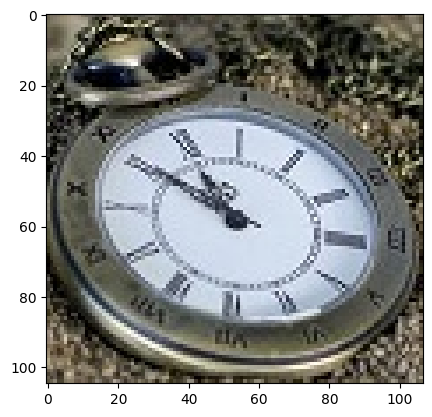

(<matplotlib.image.AxesImage at 0x1b311cac890>, None)

In [2]:
im = Image.open("../Images/clock.jpg") # the original small clock image
pylab.imshow(im), pylab.show()

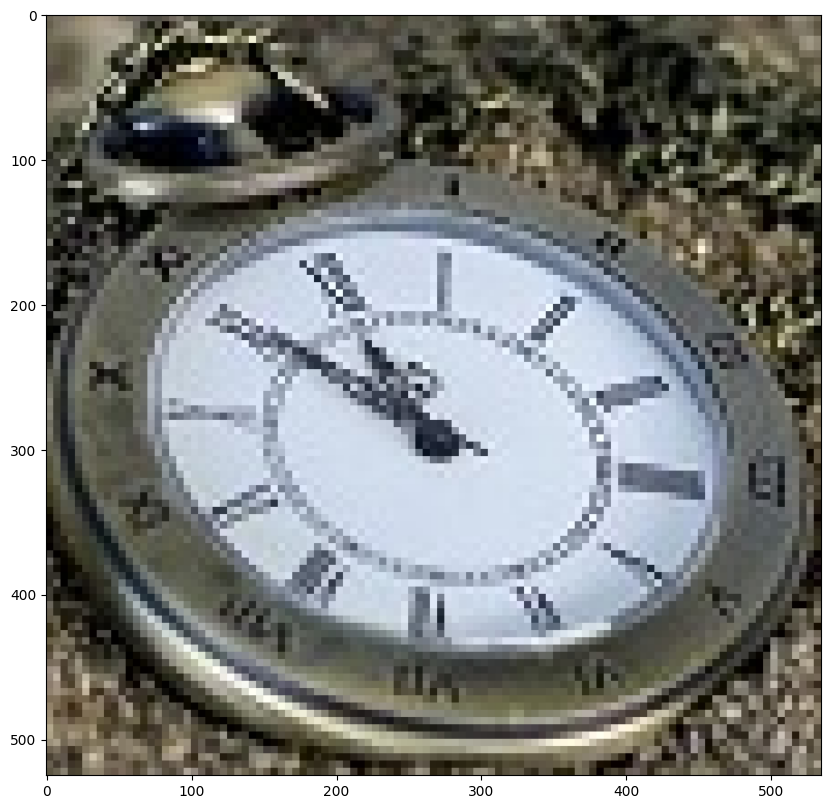

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [3]:
im1 = im.resize((im.width*5, im.height*5), Image.NEAREST) # nearest neighbor interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()


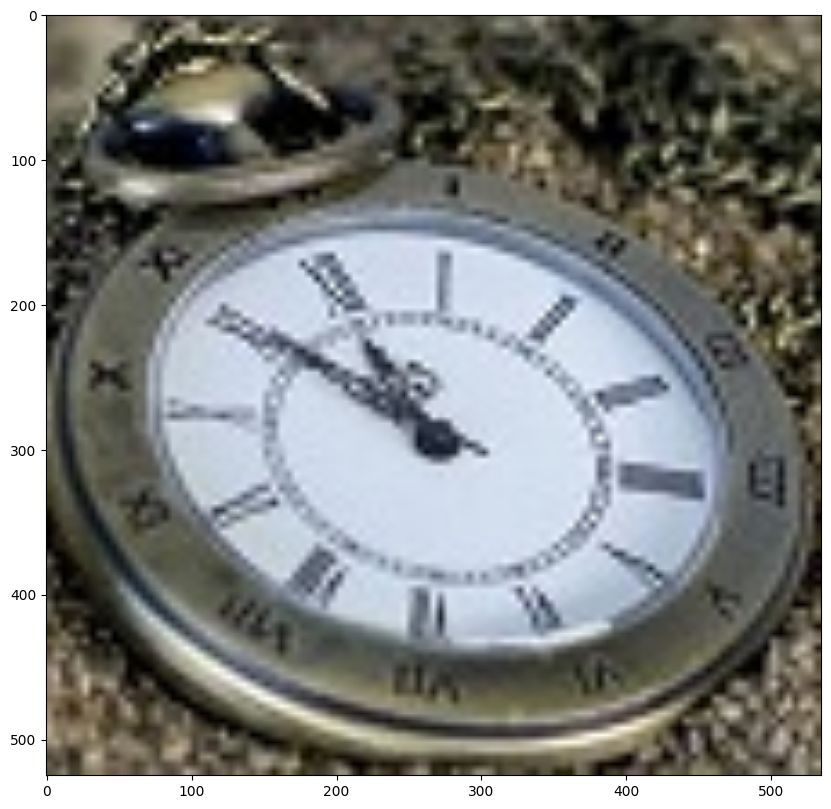

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [4]:
im1 = im.resize((im.width*5, im.height*5), Image.BILINEAR) # up-sample with bi-linear interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

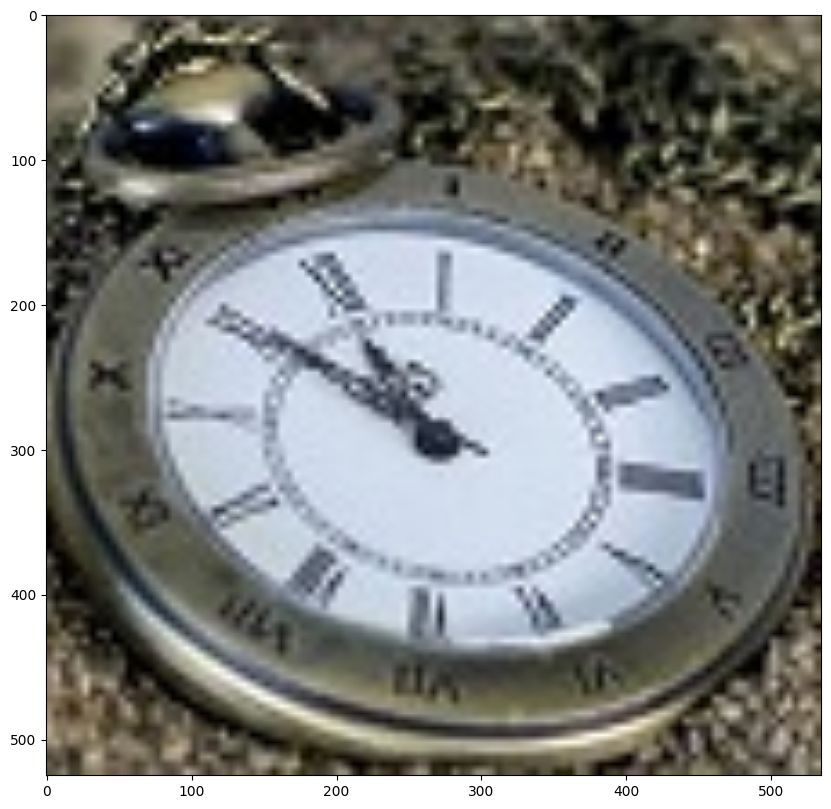

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [5]:
im.resize((im.width*10, im.height*10), Image.BICUBIC).show() # bi-cubic interpolation
pylab.figure(figsize=(10,10)), pylab.imshow(im1), pylab.show()

In [6]:
im = Image.open("../Images/tajmahal.jpg")
im.show()

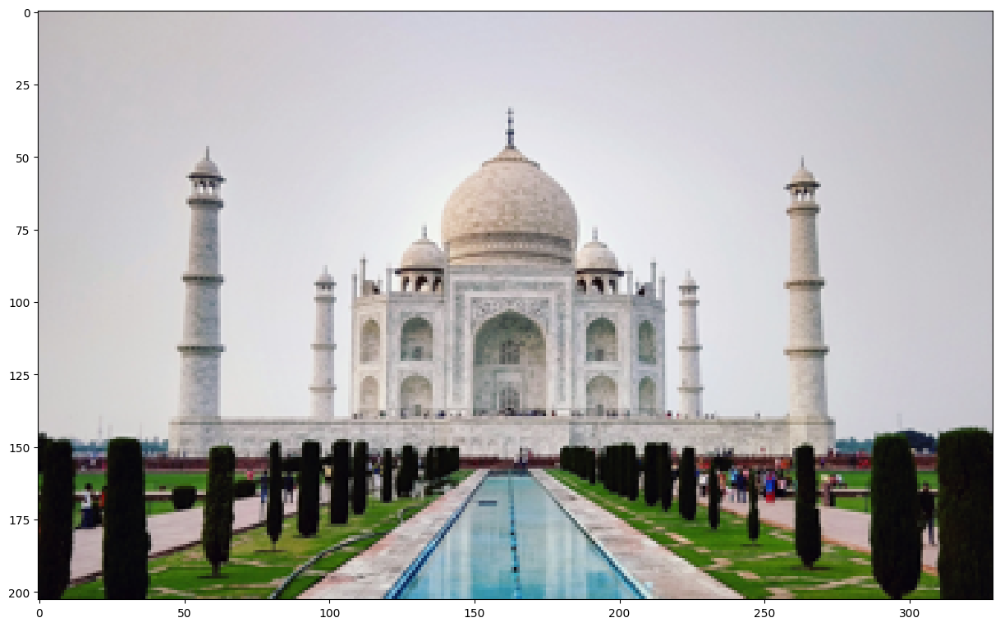

(<Figure size 1500x1000 with 1 Axes>,
 None)

In [7]:
im = im.resize((im.width//5, im.height//5))
pylab.figure(figsize=(15,10)), pylab.imshow(im), pylab.show()

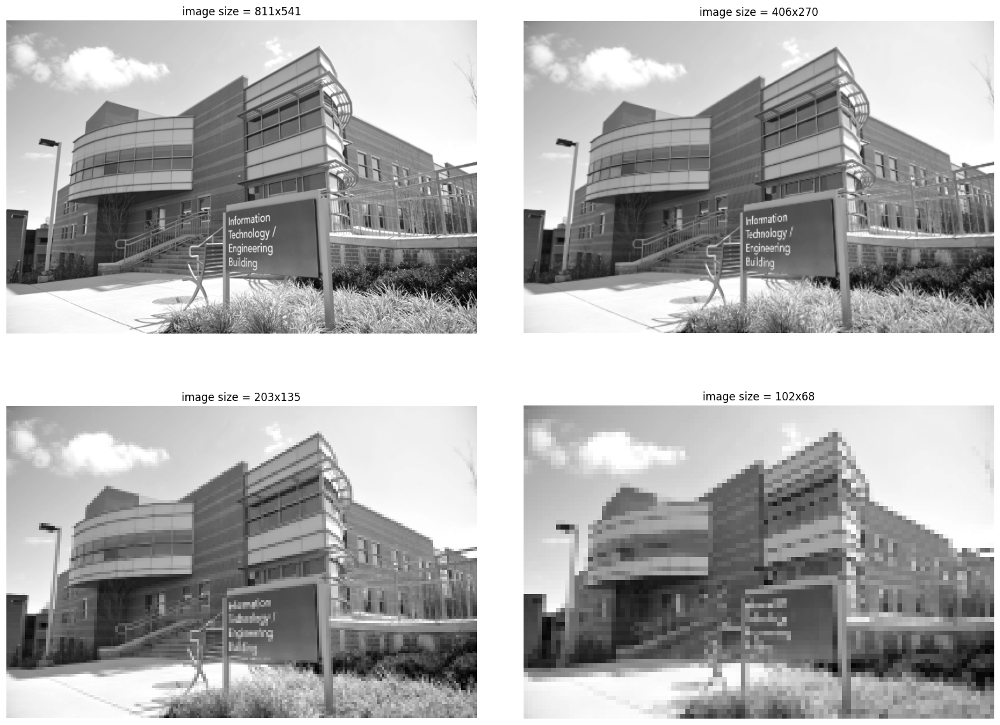

In [12]:
import pylab
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import rescale

im = imread('../Images/umbc.png')
im_gray = rgb2gray(im) 
im1 = im_gray.copy()
pylab.figure(figsize=(20,15))
for i in range(4):
    pylab.subplot(2,2,i+1), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
    pylab.title('image size = ' + str(im1.shape[1]) + 'x' + str(im1.shape[0]))
    im1 = rescale(im1, scale = 0.5, anti_aliasing=False)
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

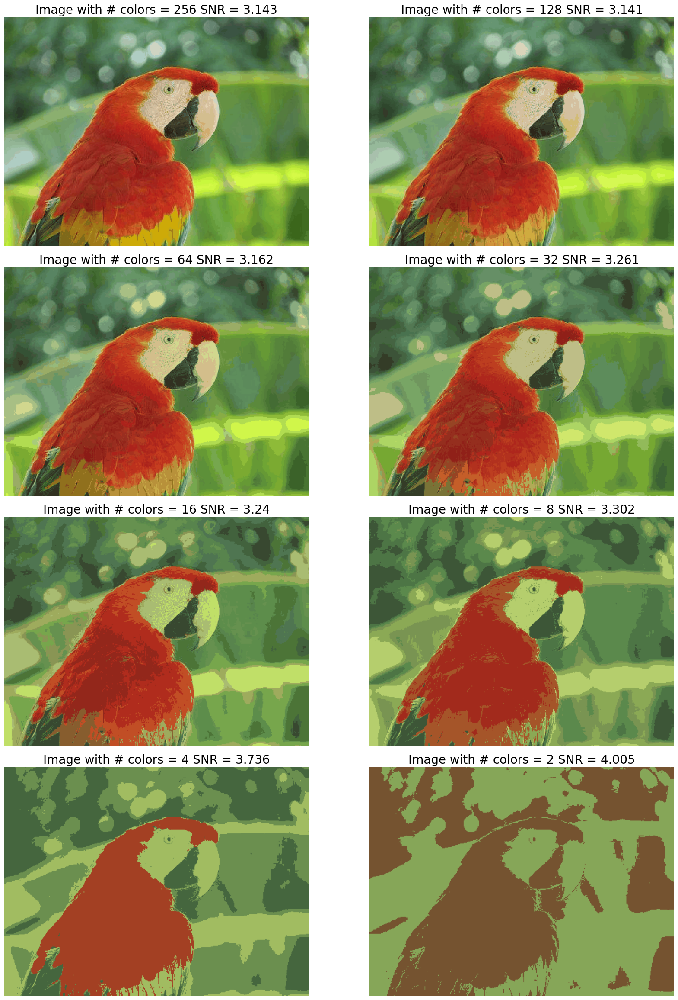

In [13]:
import pylab
import numpy as np
from PIL import Image
from scipy.signal import find_peaks
from skimage.metrics import structural_similarity as ssim

def calculate_snr(image):
    # Convert the image to grayscale
    gray_image = image.convert('L')
    
    # Calculate the SNR using NumPy
    signal = np.mean(gray_image)
    noise = np.std(gray_image)
    snr = signal / noise
    
    return snr

im = Image.open('../Images/parrot.jpg')
pylab.figure(figsize=(20, 30))
num_colors_list = [1 << n for n in range(8, 0, -1)]
snr_list = []
i = 1

for num_colors in num_colors_list:
    im1 = im.convert('P', palette=Image.ADAPTIVE, colors=num_colors)
    pylab.subplot(4, 2, i), pylab.imshow(im1), pylab.axis('off')
    snr = calculate_snr(im1)
    snr_list.append(snr)
    pylab.title('Image with # colors = ' + str(num_colors) + ' SNR = ' +
                str(np.round(snr_list[i - 1], 3)), size=20)
    i += 1

pylab.subplots_adjust(wspace=0.2, hspace=0)
pylab.show()


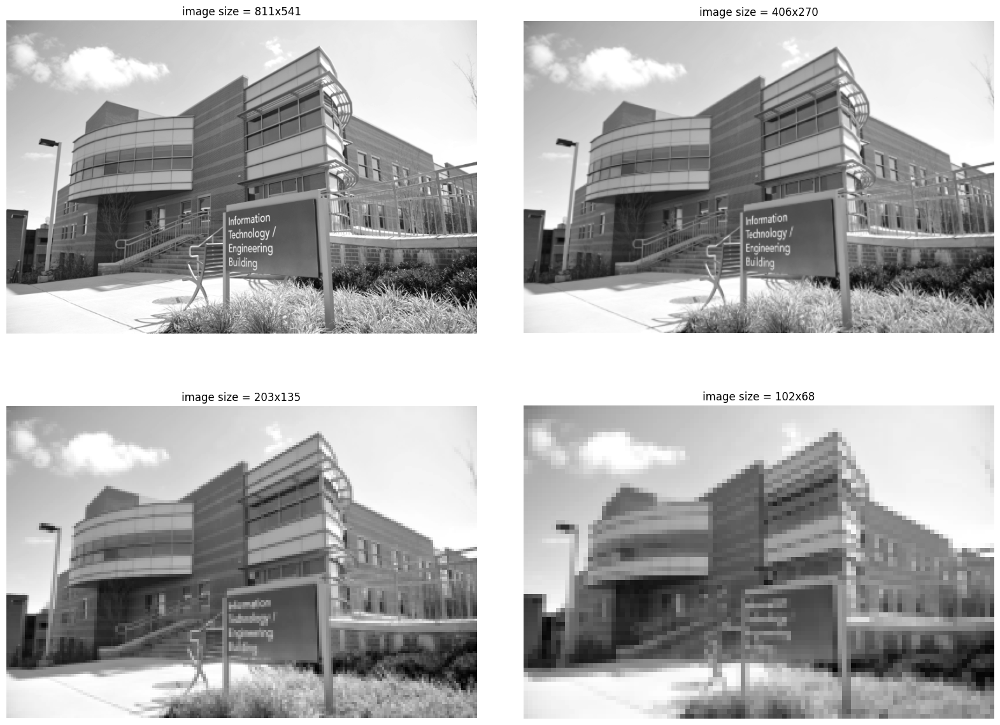

In [14]:
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.transform import rescale
import pylab

# Load the color image
im = imread('../Images/umbc.png')

# Convert the color image to grayscale
im1 = rgb2gray(im)

pylab.figure(figsize=(20, 15))
for i in range(4):
    pylab.subplot(2, 2, i + 1), pylab.imshow(im1, cmap='gray'), pylab.axis('off')
    pylab.title('image size = ' + str(im1.shape[1]) + 'x' + str(im1.shape[0]))
    im1 = rescale(im1, scale=0.5, anti_aliasing=True)##
pylab.subplots_adjust(wspace=0.1, hspace=0.1)
pylab.show()

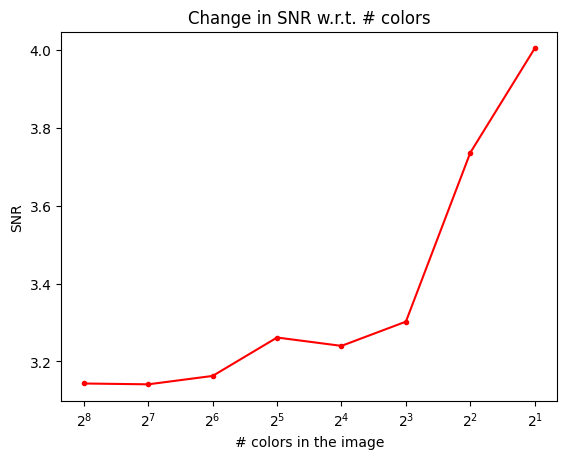

In [15]:
import matplotlib.pyplot as plt
import numpy as np
pylab.plot(num_colors_list, snr_list, 'r.-')
pylab.xlabel('# colors in the image')
pylab.ylabel('SNR')
pylab.title('Change in SNR w.r.t. # colors')
pylab.xscale('log', base=2) #basex is written as base
pylab.gca().invert_xaxis()
pylab.show()

C:\Users\VIGHNESH GAVIT\AppData\Roaming\Python\Python311\site-packages\skimage\metrics\simple_metrics.py:163: RuntimeWarning: divide by zero encountered in scalar divide
  return 10 * np.log10((data_range ** 2) / err)
C:\Users\VIGHNESH GAVIT\AppData\Local\Temp\ipykernel_1528\83754599.py:23: UserWarning: Inputs have mismatched dtype.  Setting data_range based on image_true.
  snr_reconstruction = peak_signal_noise_ratio(im, im1)


SNR for the original image = inf
SNR for the image obtained after reconstruction = 309.2786935632994


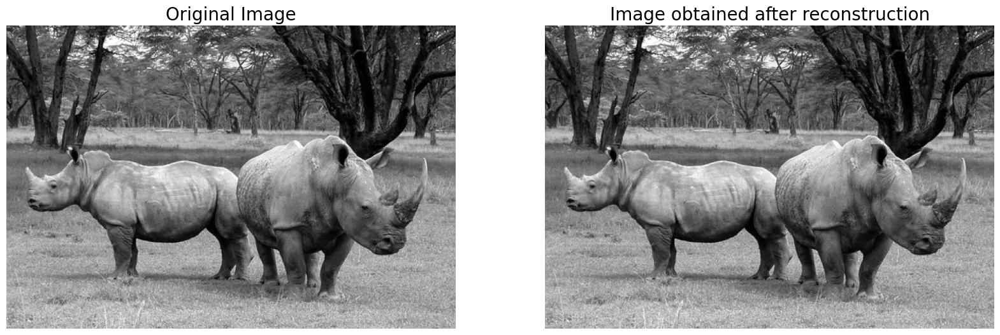

In [16]:
from PIL import Image
import numpy as np
from scipy.fft import fft2, ifft2
from skimage.metrics import peak_signal_noise_ratio
import matplotlib.pyplot as plt

# Load the image using Pillow (PIL)
im = Image.open('../Images/rhino.jpg').convert('L')  # Convert to grayscale

# Convert the PIL image to a NumPy array
im = np.array(im)

# Calculate SNR for the original image
snr_original = peak_signal_noise_ratio(im, im)

print('SNR for the original image =', snr_original)

# Perform FFT and IFFT
freq = fft2(im)
im1 = ifft2(freq).real

# Calculate SNR for the image obtained after reconstruction
snr_reconstruction = peak_signal_noise_ratio(im, im1)

print('SNR for the image obtained after reconstruction =', snr_reconstruction)

# Make sure the forward and inverse FFT are close to each other
assert np.allclose(im, im1)

# Display the original and reconstructed images
plt.figure(figsize=(20, 10))
plt.subplot(121), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.title('Original Image', size=20)
plt.subplot(122), plt.imshow(im1, cmap='gray'), plt.axis('off')
plt.title('Image obtained after reconstruction', size=20)
plt.show()


C:\Users\VIGHNESH GAVIT\AppData\Local\Temp\ipykernel_1528\4255771326.py:3: ComplexWarning: Casting complex values to real discards the imaginary part
  pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int)), pylab.show()


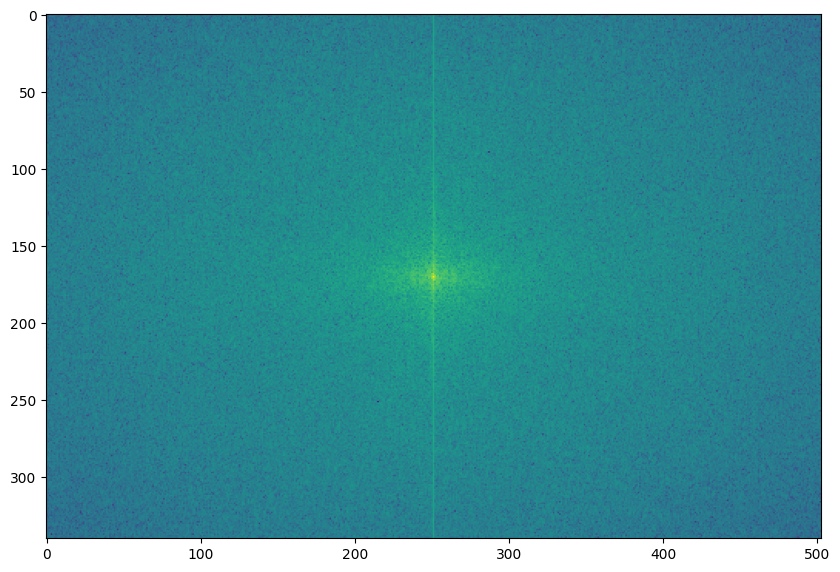

(<Figure size 1000x1000 with 1 Axes>,
 None)

In [17]:
# the quadrants are needed to be shifted around in order that the low spatial frequencies are in the center of the 2D fourier-transformed image.
freq2 = fp.fftshift(freq)
pylab.figure(figsize=(10,10)), pylab.imshow( (20*np.log10( 0.1 + freq2)).astype(int)), pylab.show()

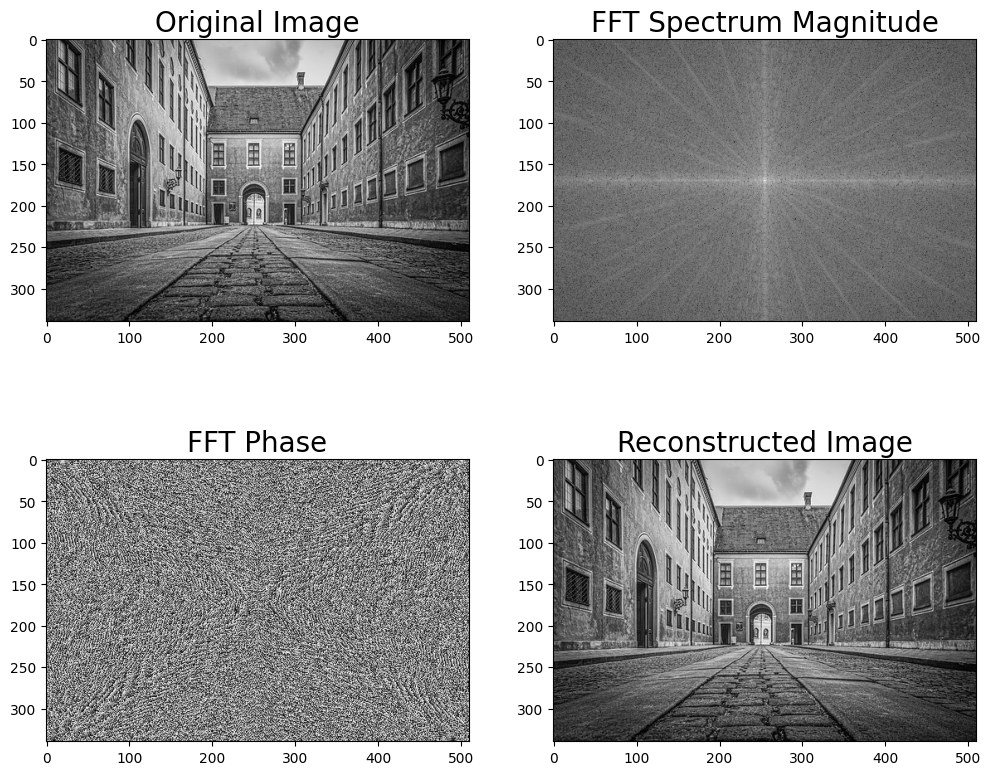

In [18]:
from skimage.io import imread
from skimage.color import rgba2rgb, rgb2gray
import numpy.fft as fp
import matplotlib.pyplot as plt

# Read the image and remove the alpha channel
im = imread('../Images/house.png')
im_rgb = rgba2rgb(im)

# Convert the image to grayscale
im_gray = rgb2gray(im_rgb)

# Perform FFT and reconstruct the image
freq = fp.fft2(im_gray)
im_reconstructed = fp.ifft2(freq).real

# Plotting
plt.figure(figsize=(12, 10))
plt.subplot(2, 2, 1), plt.imshow(im_gray, cmap='gray'), plt.title('Original Image', size=20)
plt.subplot(2, 2, 2), plt.imshow(20 * np.log10(0.01 + np.abs(fp.fftshift(freq))), cmap='gray')
plt.title('FFT Spectrum Magnitude', size=20)
plt.subplot(2, 2, 3), plt.imshow(np.angle(fp.fftshift(freq)), cmap='gray')
plt.title('FFT Phase', size=20)
plt.subplot(2, 2, 4), plt.imshow(np.clip(im_reconstructed, 0, 255), cmap='gray')
plt.title('Reconstructed Image', size=20)
plt.show()

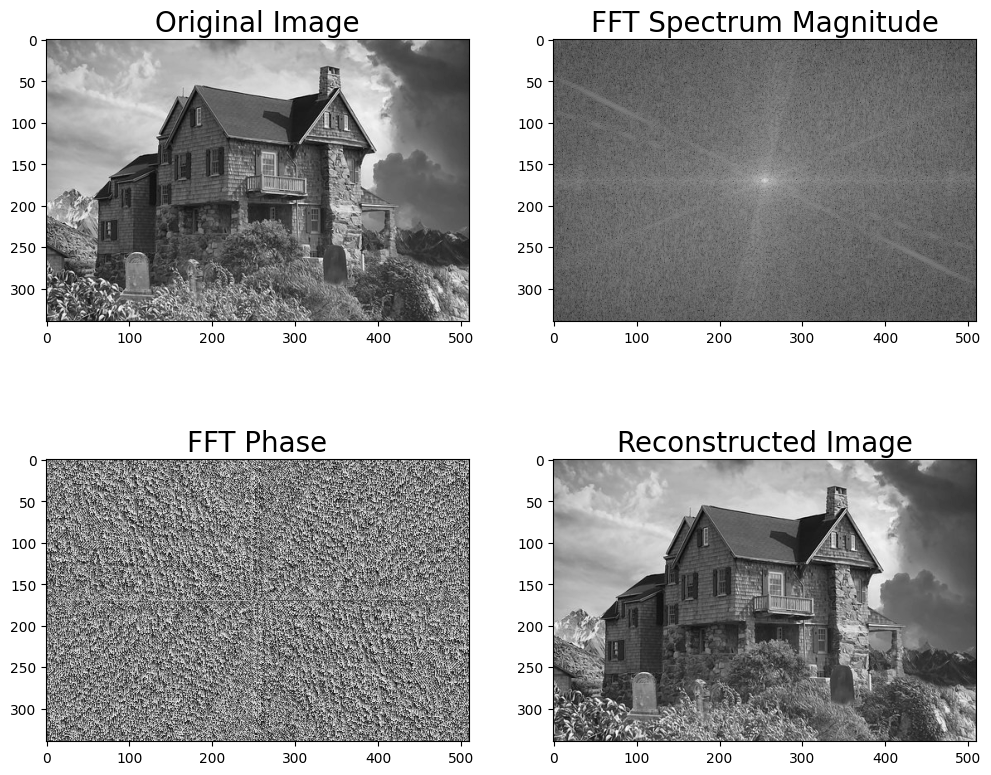

In [19]:
from skimage.io import imread
from skimage.color import rgba2rgb, rgb2gray
import numpy.fft as fp
import matplotlib.pyplot as plt

# Read the image and remove the alpha channel
im2 = imread('../Images/house2.png')
im2_rgb = rgba2rgb(im2)

# Convert the image to grayscale
im2_gray = rgb2gray(im2_rgb)

# Perform FFT and reconstruct the image
freq2 = fp.fft2(im2_gray)
im2_reconstructed = fp.ifft2(freq2).real

# Plotting
plt.figure(figsize=(12, 10))
plt.subplot(2, 2, 1), plt.imshow(im2_gray, cmap='gray'), plt.title('Original Image', size=20)
plt.subplot(2, 2, 2), plt.imshow(20 * np.log10(0.01 + np.abs(fp.fftshift(freq2))), cmap='gray')
plt.title('FFT Spectrum Magnitude', size=20)
plt.subplot(2, 2, 3), plt.imshow(np.angle(fp.fftshift(freq2)), cmap='gray')
plt.title('FFT Phase', size=20)
plt.subplot(2, 2, 4), plt.imshow(np.clip(im2_reconstructed, 0, 255), cmap='gray')
plt.title('Reconstructed Image', size=20)
plt.show()

0.9921568627450982
(256, 256)


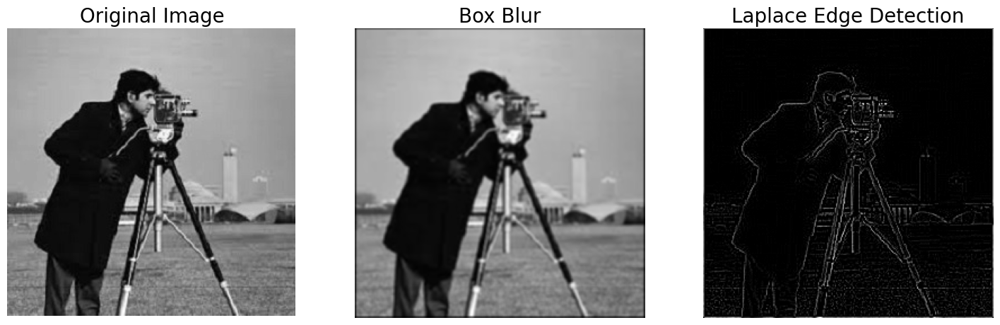

In [23]:
im = rgb2gray(imread('../Images/cameraman.jpg')).astype(float)
print(np.max(im))
print(im.shape)
blur_box_kernel = np.ones((3,3)) / 9
edge_laplace_kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])
im_blurred = signal.convolve2d(im, blur_box_kernel)
im_edges = np.clip(signal.convolve2d(im, edge_laplace_kernel), 0, 1)
fig, axes = pylab.subplots(ncols=3, sharex=True, sharey=True, figsize=(18,6))
axes[0].imshow(im, cmap=pylab.cm.gray)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_blurred, cmap=pylab.cm.gray)
axes[1].set_title('Box Blur', size=20)
axes[2].imshow(im_edges, cmap=pylab.cm.gray)
axes[2].set_title('Laplace Edge Detection', size=20)
for ax in axes:
    ax.axis('off')
pylab.show()

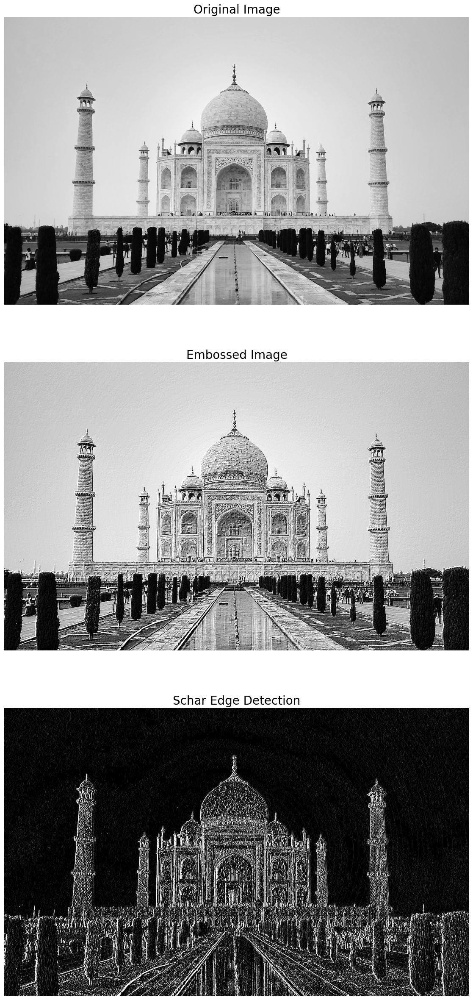

In [24]:
from PIL import Image
import numpy as np
from scipy import signal
import matplotlib.pyplot as plt

# Load the image using Pillow and convert to grayscale
im = np.array(Image.open('../Images/tajmahal.jpg').convert('L')) / 255.0

# Define emboss and edge detection kernels
emboss_kernel = np.array([[-2, -1, 0], [-1, 1, 1], [0, 1, 2]])
edge_schar_kernel = np.array([[-3, 0, +3], [-10, 0, +10], [-3, 0, +3]])

# Apply emboss and edge detection filters
im_embossed = np.clip(signal.convolve2d(im, emboss_kernel, mode='same', boundary="symm"), 0, 1)
im_edges = np.clip(signal.convolve2d(im, edge_schar_kernel, mode='same', boundary="symm"), 0, 1)

# Plot the images
fig, axes = plt.subplots(nrows=3, figsize=(20, 30))
axes[0].imshow(im, cmap='gray')
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_embossed, cmap='gray')
axes[1].set_title('Embossed Image', size=20)
axes[2].imshow(im_edges, cmap='gray')
axes[2].set_title('Schar Edge Detection', size=20)
for ax in axes:
    ax.axis('off')
plt.show()

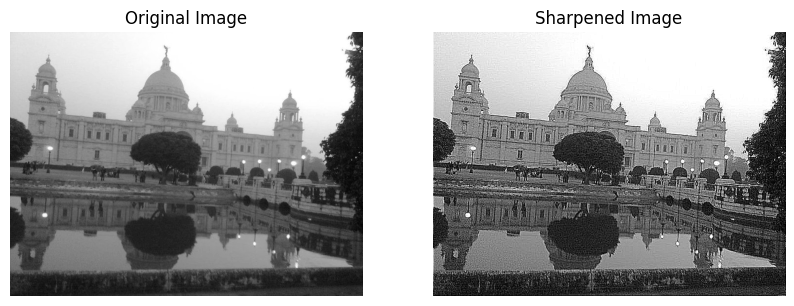

In [26]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import convolve2d

# Load the image using Pillow
im = np.array(Image.open('../Images/victoria_memorial.png').convert('L')).astype(float)

# Apply sharpening kernel
sharpen_kernel = np.array([[-1, -1, -1],
                           [-1, 9, -1],
                           [-1, -1, -1]])

sharpened_image = np.clip(convolve2d(im, sharpen_kernel, mode='same', boundary='wrap'), 0, 255)

# Display the original and sharpened images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(im, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sharpened_image, cmap='gray')
plt.title('Sharpened Image')
plt.axis('off')

plt.show()

C:\Users\VIGHNESH GAVIT\AppData\Local\Temp\ipykernel_1528\2362954383.py:1: DeprecationWarning: scipy.misc.face has been deprecated in SciPy v1.10.0; and will be completely removed in SciPy v1.12.0. Dataset methods have moved into the scipy.datasets module. Use scipy.datasets.face instead.
  face_image = misc.face(gray=True) - misc.face(gray=True).mean()
C:\Users\VIGHNESH GAVIT\AppData\Local\Temp\ipykernel_1528\2362954383.py:18: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  fig.show()


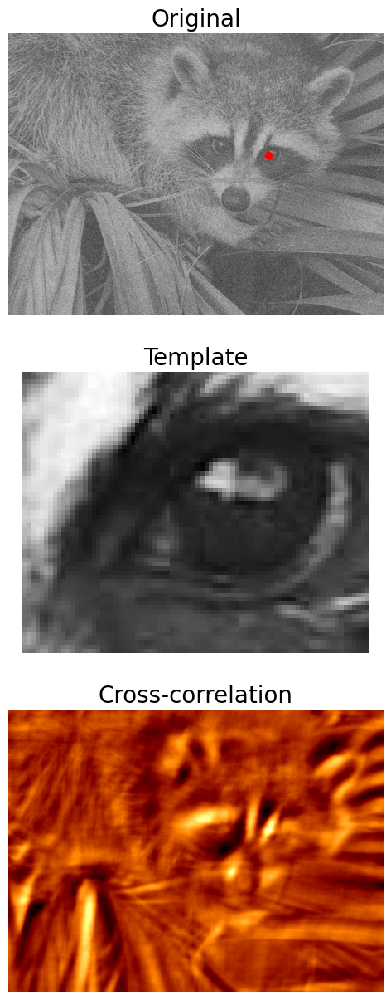

In [27]:
face_image = misc.face(gray=True) - misc.face(gray=True).mean()
template_image = np.copy(face_image[300:365, 670:750]) # right eye
template_image -= template_image.mean()
face_image = face_image + np.random.randn(*face_image.shape) * 50 # add random noise
correlation = signal.correlate2d(face_image, template_image, boundary='symm', mode='same')
y, x = np.unravel_index(np.argmax(correlation), correlation.shape) # find the match
fig, (ax_original, ax_template, ax_correlation) = pylab.subplots(3, 1, figsize=(6, 15))
ax_original.imshow(face_image, cmap='gray')
ax_original.set_title('Original', size=20)
ax_original.set_axis_off()
ax_template.imshow(template_image, cmap='gray')
ax_template.set_title('Template', size=20)
ax_template.set_axis_off()
ax_correlation.imshow(correlation, cmap='afmhot')
ax_correlation.set_title('Cross-correlation', size=20)
ax_correlation.set_axis_off()
ax_original.plot(x, y, 'ro')
fig.show()

(224, 225)


C:\Users\VIGHNESH GAVIT\AppData\Local\Temp\ipykernel_1528\224187987.py:13: DeprecationWarning: Importing gaussian from 'scipy.signal' is deprecated and will raise an error in SciPy 1.13.0. Please use 'scipy.signal.windows.gaussian' or the convenience function 'scipy.signal.get_window' instead.
  gauss_kernel = np.outer(signal.gaussian(11, 3), signal.gaussian(11, 3))


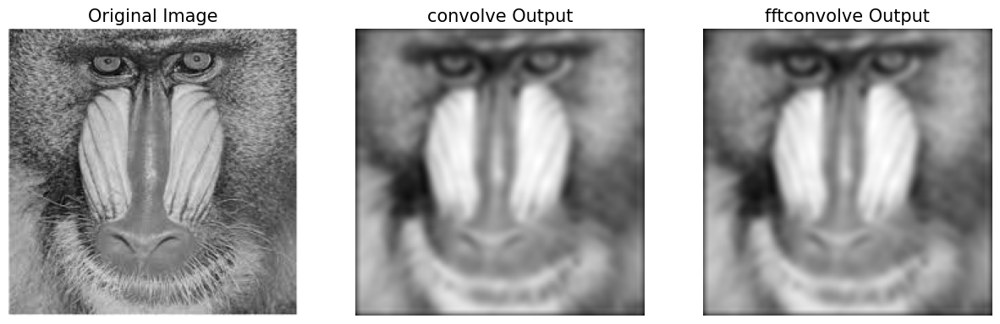

In [28]:
from PIL import Image
import numpy as np
import scipy.signal as signal
import matplotlib.pyplot as plt
import timeit

# Read the image using Pillow
im = np.array(Image.open('../Images/mandrill.jpg').convert('RGB'))
im = np.mean(im, axis=2)
print(im.shape)  # Verify the shape

# Define the Gaussian kernel
gauss_kernel = np.outer(signal.gaussian(11, 3), signal.gaussian(11, 3))

# Convolve and FFT-convolve as before
im_blurred1 = signal.convolve(im, gauss_kernel, mode="same")
im_blurred2 = signal.fftconvolve(im, gauss_kernel, mode='same')

# Wrapper function for convolve
def wrapper_convolve(func):
    def wrapped_convolve():
        return func(im, gauss_kernel, mode="same")
    return wrapped_convolve

wrapped_convolve = wrapper_convolve(signal.convolve)
wrapped_fftconvolve = wrapper_convolve(signal.fftconvolve)

# Measure execution times
times1 = timeit.repeat(wrapped_convolve, number=1, repeat=100)
times2 = timeit.repeat(wrapped_fftconvolve, number=1, repeat=100)

# Display the images
plt.figure(figsize=(15, 5))
plt.gray()
plt.subplot(131), plt.imshow(im), plt.title('Original Image', size=15), plt.axis('off')
plt.subplot(132), plt.imshow(im_blurred1), plt.title('convolve Output', size=15), plt.axis('off')
plt.subplot(133), plt.imshow(im_blurred2), plt.title('fftconvolve Output', size=15), plt.axis('off')
plt.show()
